This project aims to develop a predictive model to identify the likelihood of bankruptcy for Taiwanese companies.

In [3]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_validate
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from tqdm import tqdm
import os
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
from sklearn.decomposition import PCA
from sklearn.feature_selection import RFE
from sklearn.feature_selection import f_classif
from imblearn.under_sampling import RandomUnderSampler
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix, make_scorer, auc, precision_recall_curve
from scipy.stats import norm
import joblib
import numpy as np
import matplotlib.pyplot as plt
import itertools
import seaborn as sns

In [24]:
df = pd.read_csv('data.csv')

In [ ]:
df

This is a binary classification problem, where the goal is to predict whether a company will go bankrupt or not based on various financial features.
There is a total of 6819 samples in the dataset with 96 features.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

In [ ]:
pd.set_option('display.max_rows', None)
print(df.isnull().sum())

Bankrupt?                                                   0
 ROA(C) before interest and depreciation before interest    0
 ROA(A) before interest and % after tax                     0
 ROA(B) before interest and depreciation after tax          0
 Operating Gross Margin                                     0
 Realized Sales Gross Margin                                0
 Operating Profit Rate                                      0
 Pre-tax net Interest Rate                                  0
 After-tax net Interest Rate                                0
 Non-industry income and expenditure/revenue                0
 Continuous interest rate (after tax)                       0
 Operating Expense Rate                                     0
 Research and development expense rate                      0
 Cash flow rate                                             0
 Interest-bearing debt interest rate                        0
 Tax rate (A)                                               0
 Net Val

In [ ]:
df_zero_count = (df == 0).sum()
pd.set_option('display.max_rows', None)
print(df_zero_count)

Bankrupt?                                                   6599
 ROA(C) before interest and depreciation before interest       1
 ROA(A) before interest and % after tax                        1
 ROA(B) before interest and depreciation after tax             1
 Operating Gross Margin                                        1
 Realized Sales Gross Margin                                   1
 Operating Profit Rate                                         1
 Pre-tax net Interest Rate                                     1
 After-tax net Interest Rate                                   1
 Non-industry income and expenditure/revenue                   1
 Continuous interest rate (after tax)                          1
 Operating Expense Rate                                        1
 Research and development expense rate                      1424
 Cash flow rate                                                1
 Interest-bearing debt interest rate                         891
 Tax rate (A)            

For some of the features here, there is a lot of 0 values.
Some of them are genuine measurements like the target class "bankrupt?" or the "Liability-Assets Flag". However, some of them represent missing data, like the "Tax Rate (A) or "Long-term Liability to Current Assets".
We're going to clean it by imputing the mean value.

In [ ]:
df.columns

Index(['Bankrupt?', ' ROA(C) before interest and depreciation before interest',
       ' ROA(A) before interest and % after tax',
       ' ROA(B) before interest and depreciation after tax',
       ' Operating Gross Margin', ' Realized Sales Gross Margin',
       ' Operating Profit Rate', ' Pre-tax net Interest Rate',
       ' After-tax net Interest Rate',
       ' Non-industry income and expenditure/revenue',
       ' Continuous interest rate (after tax)', ' Operating Expense Rate',
       ' Research and development expense rate', ' Cash flow rate',
       ' Interest-bearing debt interest rate', ' Tax rate (A)',
       ' Net Value Per Share (B)', ' Net Value Per Share (A)',
       ' Net Value Per Share (C)', ' Persistent EPS in the Last Four Seasons',
       ' Cash Flow Per Share', ' Revenue Per Share (Yuan ¥)',
       ' Operating Profit Per Share (Yuan ¥)',
       ' Per Share Net profit before tax (Yuan ¥)',
       ' Realized Sales Gross Profit Growth Rate',
       ' Operating Profit

In [25]:
columns_to_clean = [" Tax rate (A)", " Long-term Liability to Current Assets", " Inventory/Current Liability", " Interest-bearing debt interest rate"]
imputation_value = df[columns_to_clean].mean()

# Replace zero values with the mean value in the specified columns
df[columns_to_clean] = df[columns_to_clean].replace(0, imputation_value)

In [ ]:
df.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,...,0.807760,1.862942e+07,0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,1.0,0.047578
std,0.176710,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,...,0.040332,3.764501e+08,0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.0,0.050014
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000
25%,0.000000,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,...,0.796750,9.036205e-04,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.0,0.024477
50%,0.000000,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,...,0.810619,2.085213e-03,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.0,0.033798
75%,0.000000,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,...,0.826455,5.269777e-03,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.0,0.052838
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,9.820000e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000


<ipython-input-3-749f2dd813f6>:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


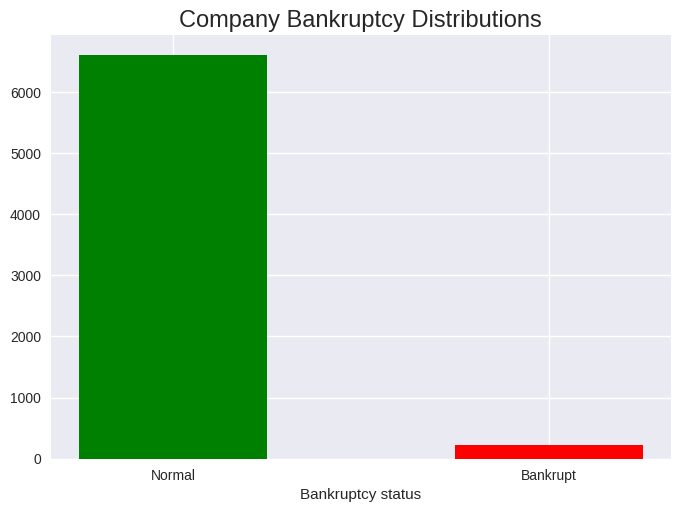

Normal:  6599 ( 96.77372048687491 % of the dataset) Bankrupt:  220 ( 3.2262795131250916 % of the dataset)


In [ ]:
plt.style.use('seaborn')

bar_df = df['Bankrupt?'].value_counts().reset_index()
plt.title('Company Bankruptcy Distributions', fontsize = 17)
plt.bar(bar_df['index'], bar_df['Bankrupt?'],
        color=['Green', 'red'], tick_label=['Normal', 'Bankrupt'], width = 0.5)


plt.xlabel('Bankruptcy status')
plt.show()
a,b = len(df[df['Bankrupt?']==0]), len(df[df['Bankrupt?']==1])
len(df[df['Bankrupt?']==0])
print("Normal: ", a, "(", a/len(df)*100,'% of the dataset)', "Bankrupt: ", b, '(', b/len(df)*100,'% of the dataset)')

Our dataset is highly unbalanced which will affect our model performance, to solve this problem we're going to use some data preprocessing methods (Oversampling and SMOTE) and see which one can give us the best model performance.

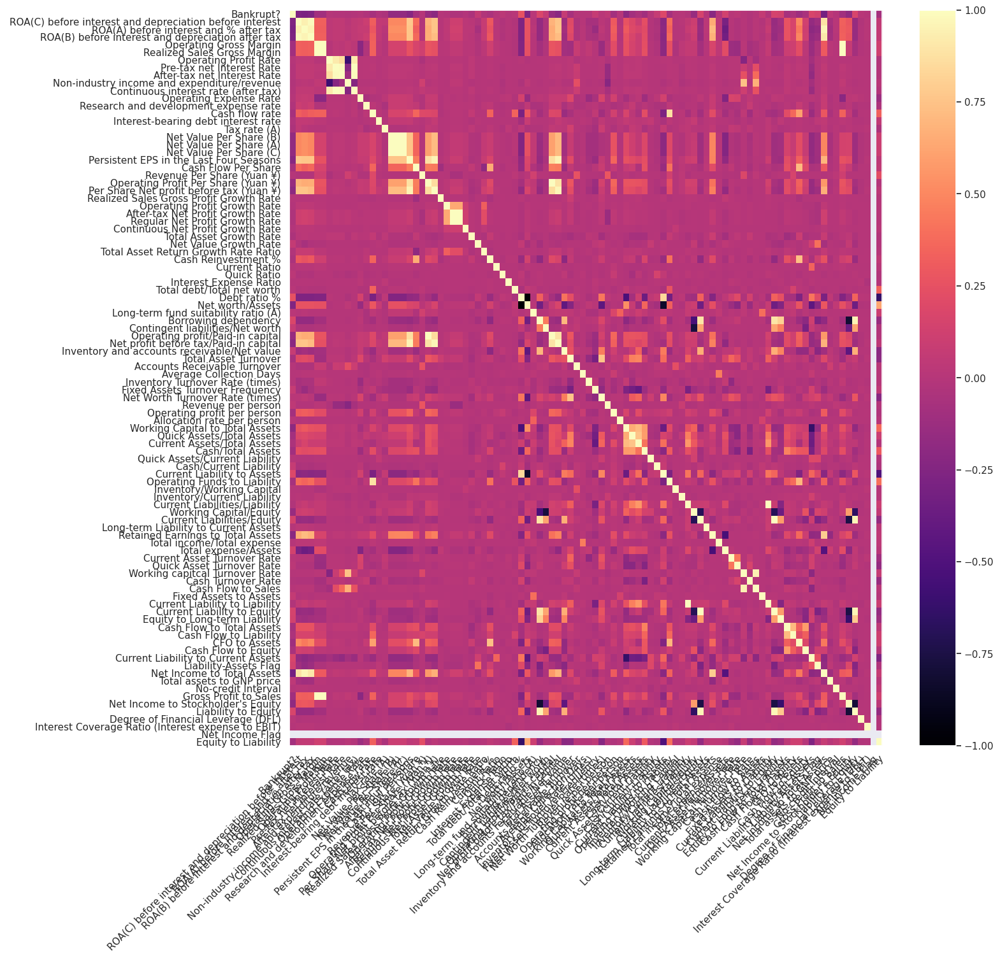

In [26]:
corr = df.corr()

fig, ax = plt.subplots(1, 1, figsize=(15, 15))
img = ax.imshow(corr, cmap='magma', interpolation='nearest', aspect='auto')
ax.set_xticks(np.arange(len(corr.columns)), labels=list(corr.columns))
ax.set_yticks(np.arange(len(corr.columns)), labels=list(corr.columns))
plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
plt.colorbar(img)
plt.show()

There are a lot of multicollinearity in the dataset which means that a regression model will not work properly on this dataset

Some features have a very high correlation between each other (for instance the 3 ROA and the 3 Net Value per share), which can cause issues in certain statistical models so we're going to remove them.

In [27]:
# Set a correlation threshold
correlation_threshold = 0.9

# Identify highly correlated features
highly_correlated_features = set()
for i in range(len(corr.columns)):
    for j in range(i):
        if abs(corr.iloc[i, j]) > correlation_threshold:
            colname = corr.columns[i]
            highly_correlated_features.add(colname)

# Drop highly correlated features
print("Original DataFrame shape:", df.shape)
df = df.drop(columns=highly_correlated_features)

# Display the filtered DataFrame
print("Filtered DataFrame shape:", df.shape)

Original DataFrame shape: (6819, 96)
Filtered DataFrame shape: (6819, 77)


This removed 19 features from the dataset

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 71 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    Operating Gross Margin                                   6819 non-null   float64
 3    Operating Profit Rate                                    6819 non-null   float64
 4    Non-industry income and expenditure/revenue              6819 non-null   float64
 5    Operating Expense Rate                                   6819 non-null   float64
 6    Research and development expense rate                    6819 non-null   float64
 7    Cash flow rate                                           6819 non-null   float64
 8    Interest-bearing 

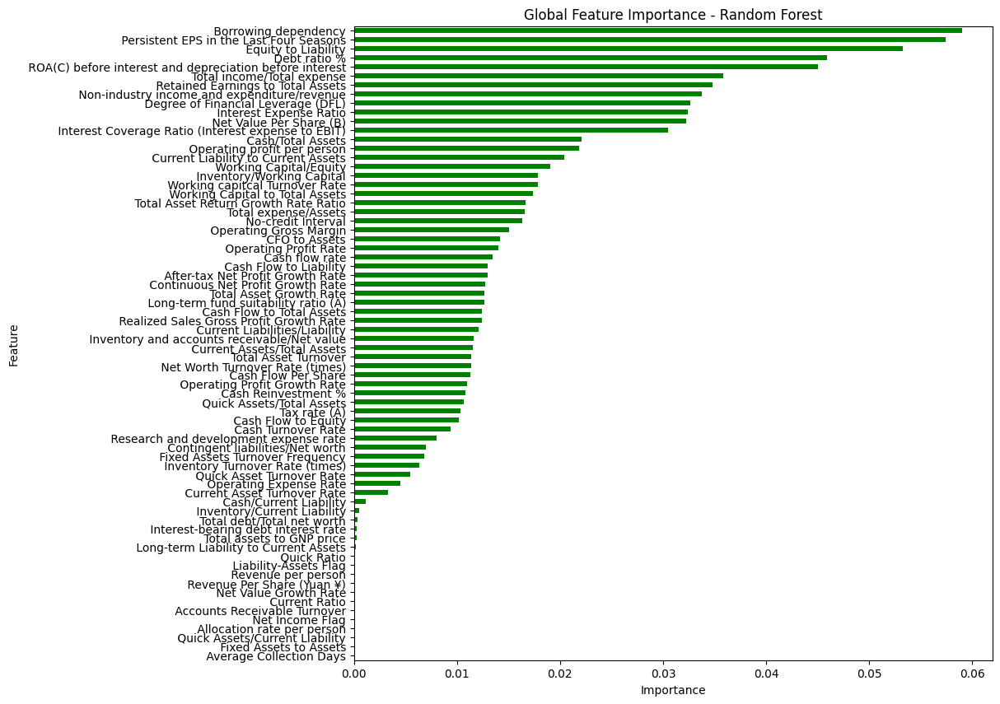

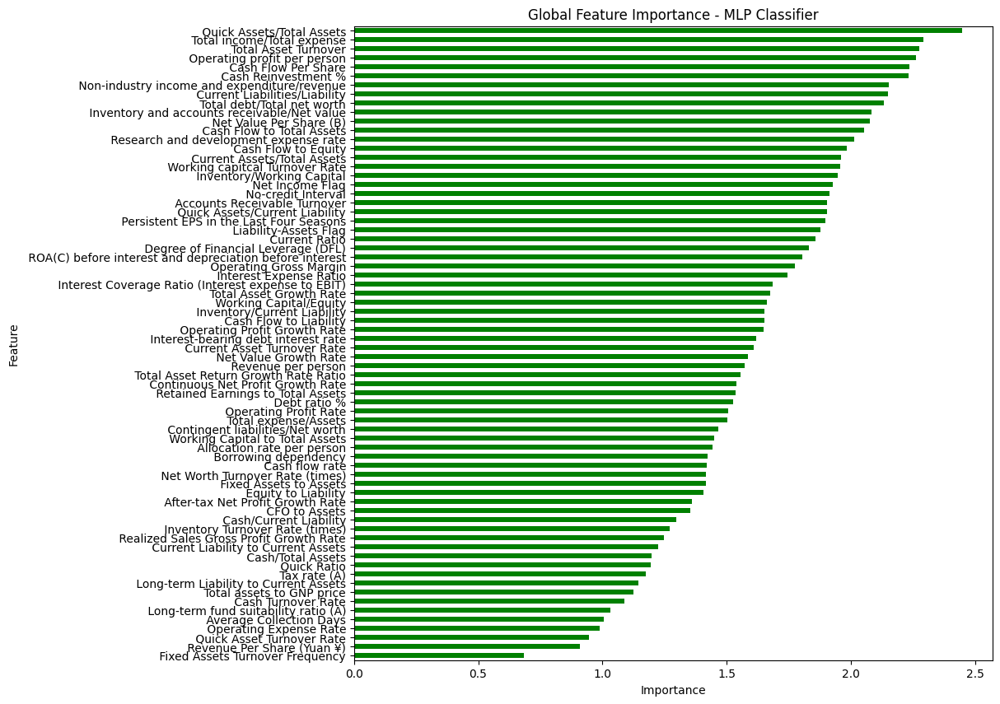

Text(0.5, 1.0, 'Global Feature Importance - Gradient Boosting')

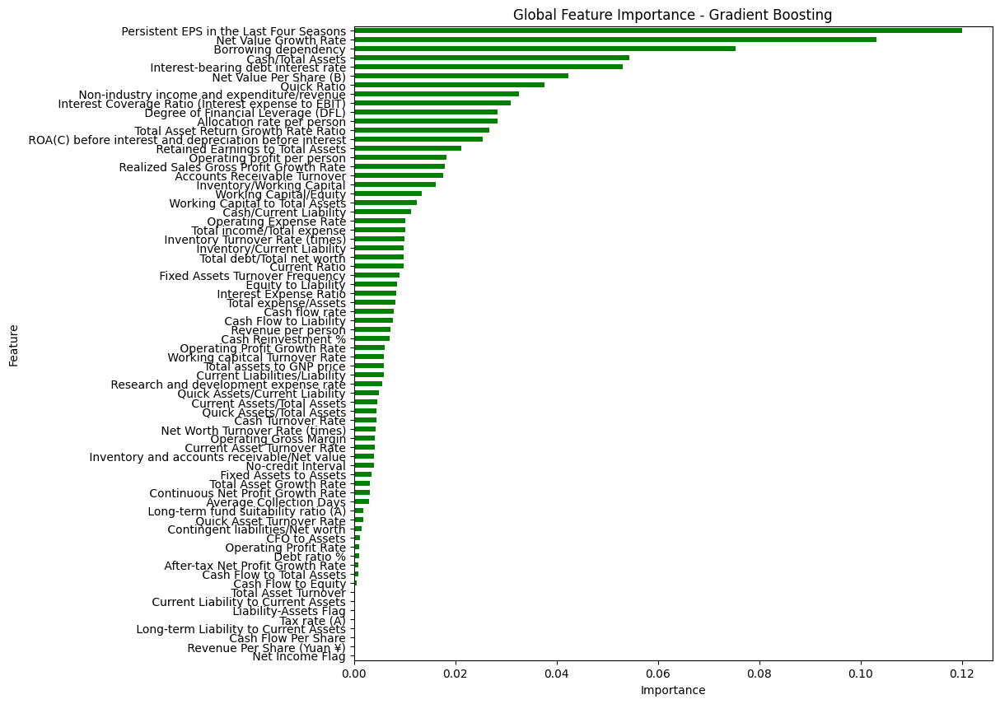

In [ ]:
X = df.drop('Bankrupt?', axis = 1)
Y = df['Bankrupt?']

scaler = StandardScaler()
X1= scaler.fit_transform(X)


model = RandomForestClassifier(n_estimators=150, max_depth=None, min_samples_split=3, criterion='entropy',random_state=42)
model.fit(X1, Y)


global_importances = pd.Series(model.feature_importances_, index=X.columns)
global_importances.sort_values(ascending=True, inplace=True)

plt.figure(figsize=(10, 10))

# Plot horizontal bar chart
global_importances.plot.barh(color='green')
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Global Feature Importance - Random Forest")

plt.show()

model = MLPClassifier(activation = 'relu', solver = 'adam', alpha = 0.0001, max_iter=1000, hidden_layer_sizes=(10,), learning_rate='adaptive', early_stopping=True, random_state = 42)
model.fit(X, Y)

# Get weights of the input layer
input_layer_weights = model.coefs_[0]

# Sum the weights for each feature to get feature importance
feature_importances = np.sum(np.abs(input_layer_weights), axis=1)

global_importances = pd.Series(feature_importances, index=X.columns)
global_importances.sort_values(ascending=True, inplace=True)

plt.figure(figsize=(10, 10))

# Plot horizontal bar chart
global_importances.plot.barh(color='green')
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Global Feature Importance - MLP Classifier")

plt.show()

model = GradientBoostingClassifier(n_estimators = 100, loss = 'log_loss', learning_rate = 0.1, max_depth = 3, min_samples_split = 3, random_state = 42)
model.fit(X, Y)


global_importances = pd.Series(model.feature_importances_, index=X.columns)
global_importances.sort_values(ascending=True, inplace=True)

plt.figure(figsize=(10, 10))

# Plot horizontal bar chart
global_importances.plot.barh(color='green')
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Global Feature Importance - Gradient Boosting")


It's hard to tell exactly which features are actually important for the different models we want to build and test. Moreover, we have high dimensional data so we're going to use PCA to reduce the number of features while retaining as much of the original variability as possible to avoid the curse of dimensionality and improve the computational cost.
We made the arbitrary choice to retain 90% of the data to strike a balance between reducing dimensionality and retaining most of the variability in the original dataset but it can be adjusted.

In [7]:
n_components = 46
pca = PCA(n_components = n_components)

X = df.drop('Bankrupt?', axis=1)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

principal_components = pca.fit_transform(X_scaled)
explained_variance_ratio = pca.explained_variance_ratio_
print("Explained Variance Ratios:", explained_variance_ratio)

Explained Variance Ratios: [0.13302639 0.07201457 0.05035846 0.04722618 0.04234799 0.03221728
 0.03049543 0.02934015 0.028018   0.02138866 0.02061347 0.01985918
 0.01790796 0.01600078 0.01578127 0.01532797 0.01518607 0.01397292
 0.01315409 0.01274948 0.01248888 0.01214463 0.01165158 0.01129505
 0.01115503 0.01098243 0.01080837 0.01071019 0.01070481 0.0105216
 0.01040354 0.01022688 0.01015939 0.01012103 0.00994858 0.00979118
 0.00977354 0.00964706 0.00950135 0.00911215 0.00905145 0.00883177
 0.00863573 0.00844508 0.00803731 0.00766375]


In [10]:
sum(explained_variance_ratio)

0.9087986564506394

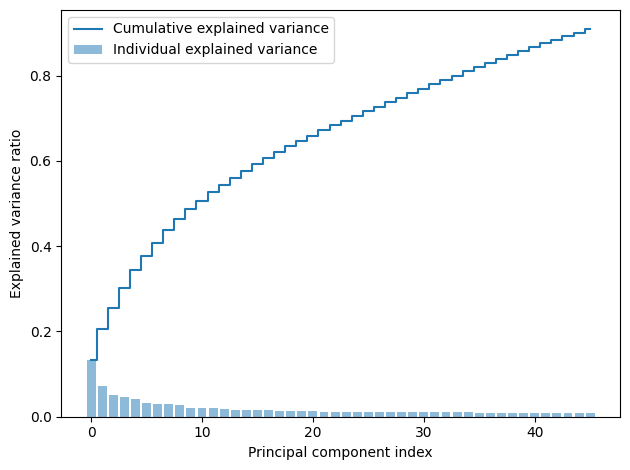

In [9]:
exp_var_pca = pca.explained_variance_ratio_

# Cumulative sum of eigenvalues; This will be used to create step plot
# for visualizing the variance explained by each principal component.

cum_sum_eigenvalues = np.cumsum(exp_var_pca)

# Create the visualization plot

plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [28]:
X = df.drop('Bankrupt?', axis=1)
y = df['Bankrupt?']

model = GradientBoostingClassifier()
#model = RandomForestClassifier()
#model = MLPClassifier()

# Initialize RFE
rfe = RFE(model, n_features_to_select=46)

X_rfe = rfe.fit_transform(X, y)

# Get selected features
selected_features = X.columns[rfe.support_]
df_rfe = df[selected_features]

In [48]:
df_rfe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 46 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 1    Non-industry income and expenditure/revenue              6819 non-null   float64
 2    Operating Expense Rate                                   6819 non-null   float64
 3    Research and development expense rate                    6819 non-null   float64
 4    Cash flow rate                                           6819 non-null   float64
 5    Interest-bearing debt interest rate                      6819 non-null   float64
 6    Net Value Per Share (B)                                  6819 non-null   float64
 7    Persistent EPS in the Last Four Seasons                  6819 non-null   float64
 8    Operating Profit 

We initially tried to use RFE to help us identify and select the most important features in the dataset by recursively removing the least important features. However, knowing that it assumes a linear relationship between features and the target variable. If the relationship is nonlinear, RFE may not effectively capture the importance of nonlinear features so we compared the performance of the models using RFE / PCA.

## Some data analysis to understand the relation between our features and the target class

Let's start by plotting some features that might interest us

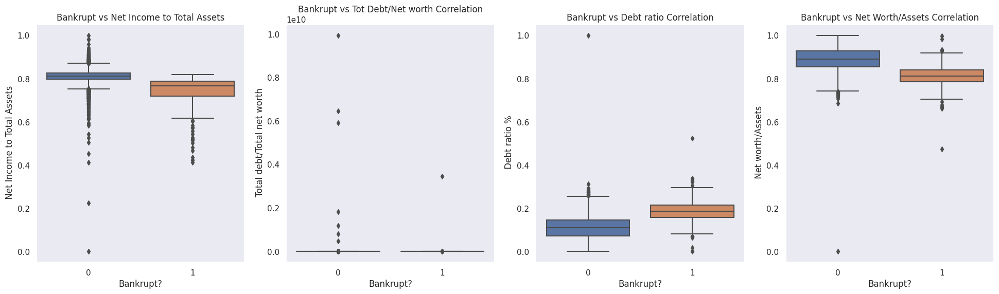

In [ ]:
f, axes = plt.subplots(ncols=4, figsize=(24,6))

sns.boxplot(x='Bankrupt?', y=" Net Income to Total Assets", data=df, ax=axes[0])
axes[0].set_title('Bankrupt vs Net Income to Total Assets')

sns.boxplot(x='Bankrupt?', y=" Total debt/Total net worth", data=df, ax=axes[1])
axes[1].set_title('Bankrupt vs Tot Debt/Net worth Correlation')


sns.boxplot(x='Bankrupt?', y=" Debt ratio %", data=df, ax=axes[2])
axes[2].set_title('Bankrupt vs Debt ratio Correlation')


sns.boxplot(x='Bankrupt?', y=" Net worth/Assets", data=df, ax=axes[3])
axes[3].set_title('Bankrupt vs Net Worth/Assets Correlation')

plt.show()

<ipython-input-70-541a739c6c12>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cash_flow_rate,ax=ax1, fit=norm, color='#FB8861')
<ipython-input-70-541a739c6c12>:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(tot_debt_net ,ax=ax2, fit=norm, color='#56F9BB')
<ipython-input-70-541a739c6c12>:13:

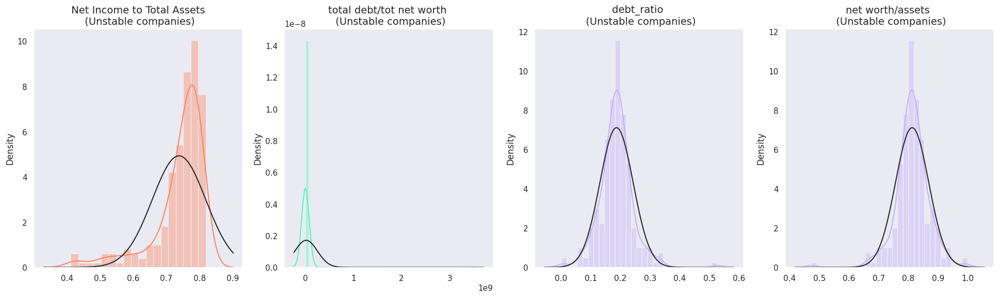

In [ ]:
f, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize=(24, 6))

cash_flow_rate = df[' Net Income to Total Assets'].loc[df['Bankrupt?'] == 1].values
sns.distplot(cash_flow_rate,ax=ax1, fit=norm, color='#FB8861')
ax1.set_title(' Net Income to Total Assets \n (Unstable companies)', fontsize=14)

tot_debt_net = df[' Total debt/Total net worth'].loc[df['Bankrupt?'] == 1].values
sns.distplot(tot_debt_net ,ax=ax2, fit=norm, color='#56F9BB')
ax2.set_title('total debt/tot net worth \n (Unstable companies)', fontsize=14)


debt_ratio = df[' Debt ratio %'].loc[df['Bankrupt?'] == 1].values
sns.distplot(debt_ratio,ax=ax3, fit=norm, color='#C5B3F9')
ax3.set_title('debt_ratio \n (Unstable companies)', fontsize=14)

net_worth_assets = df[' Net worth/Assets'].loc[df['Bankrupt?'] == 1].values
sns.distplot(net_worth_assets,ax=ax4, fit=norm, color='#C5B3F9')
ax4.set_title('net worth/assets \n (Unstable companies)', fontsize=14)

plt.show()

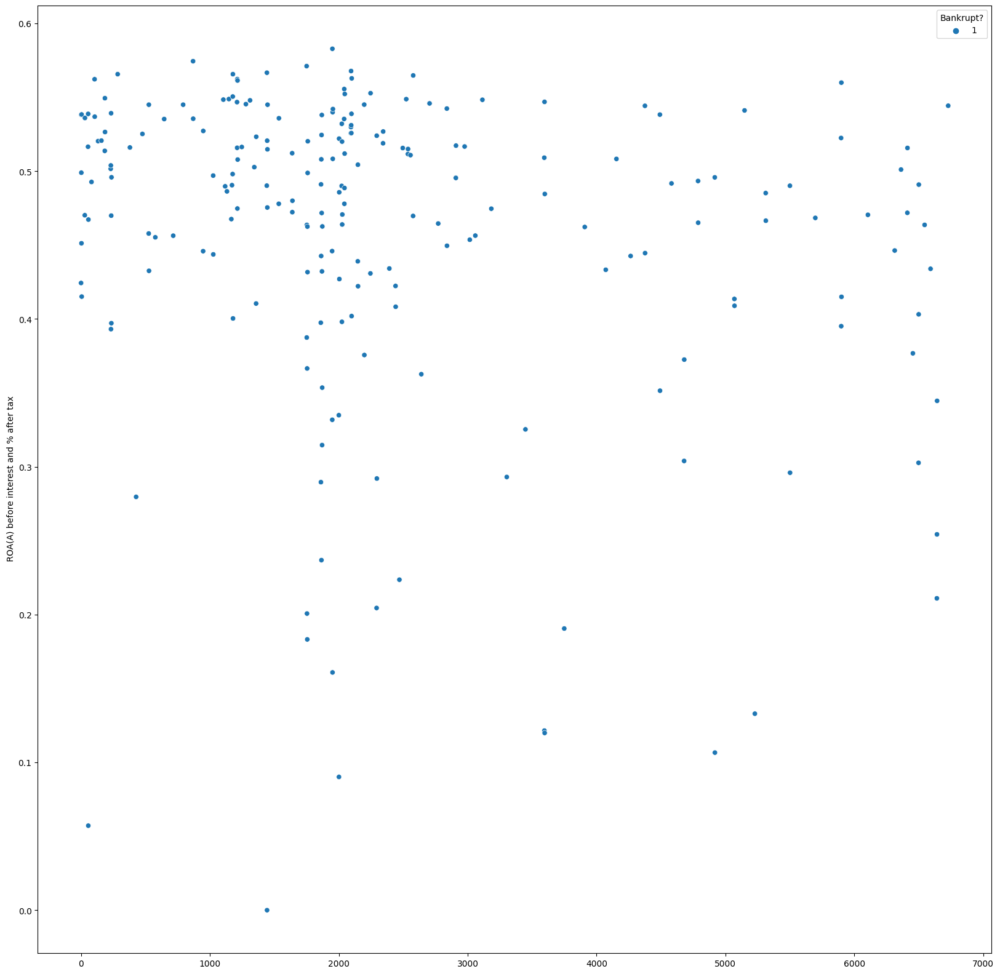

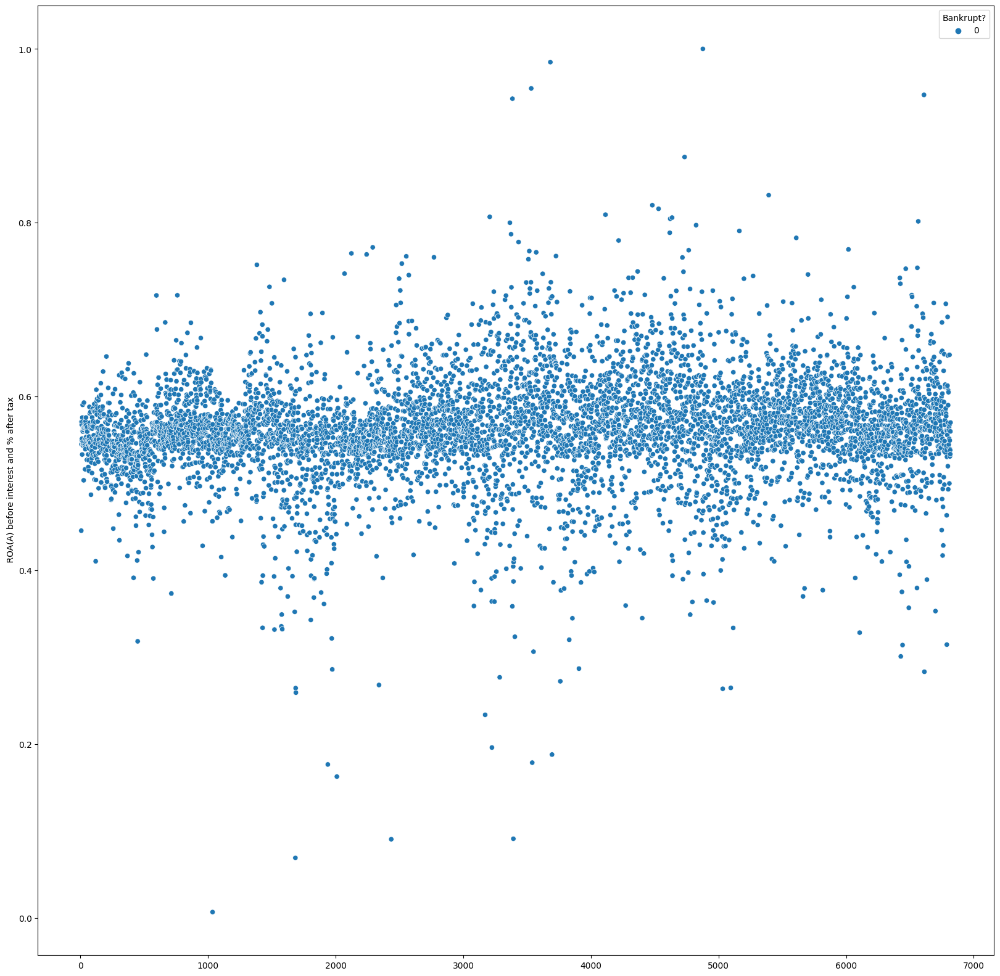

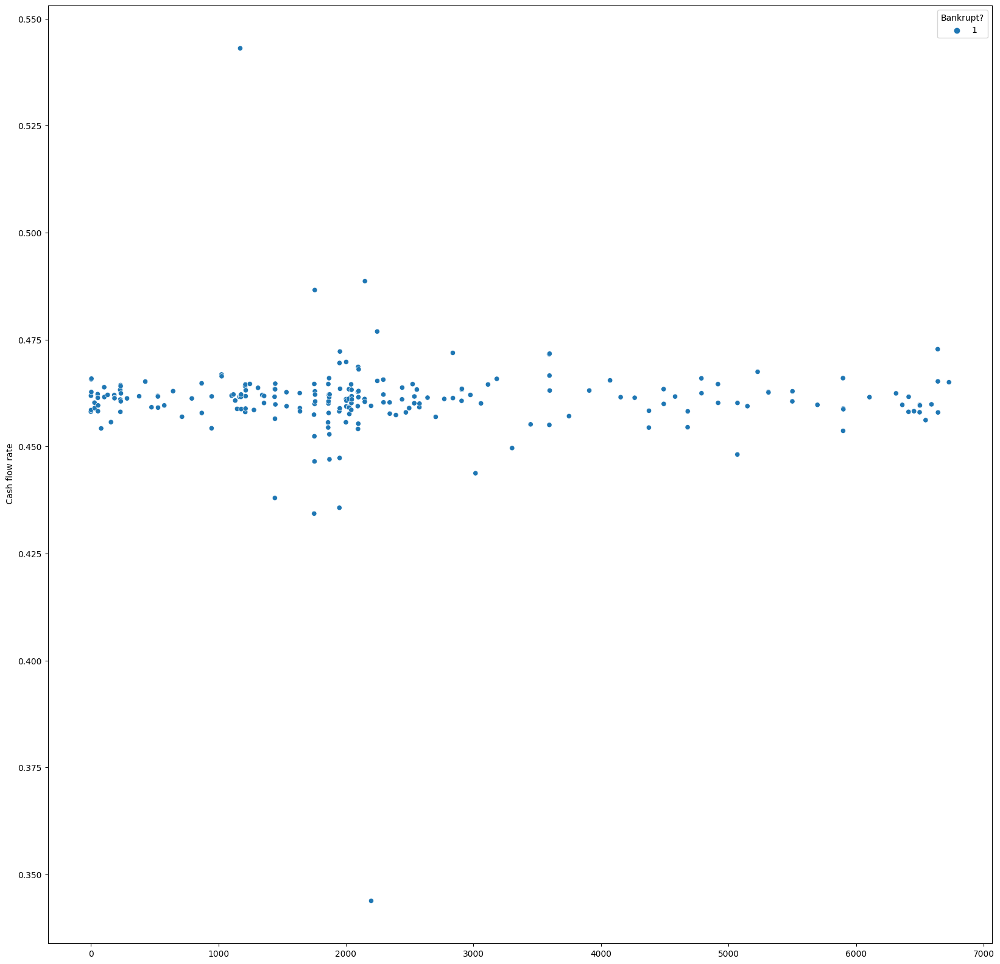

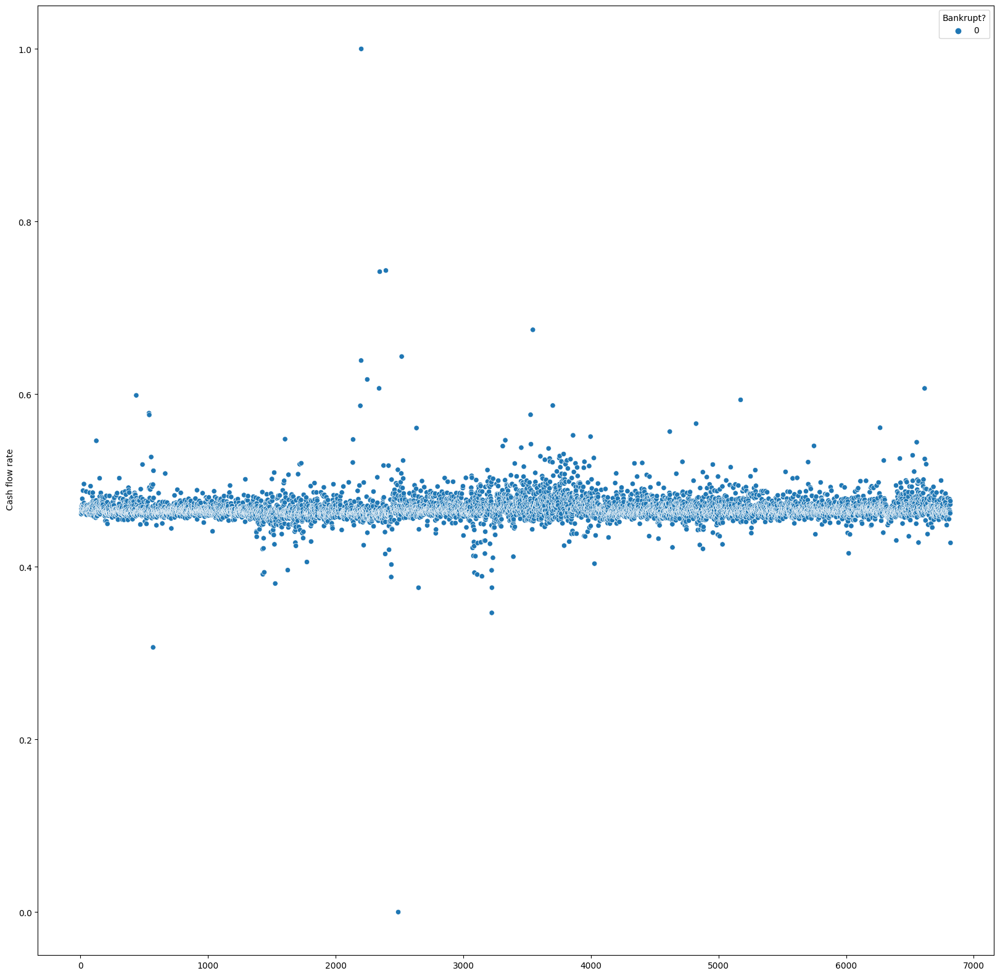

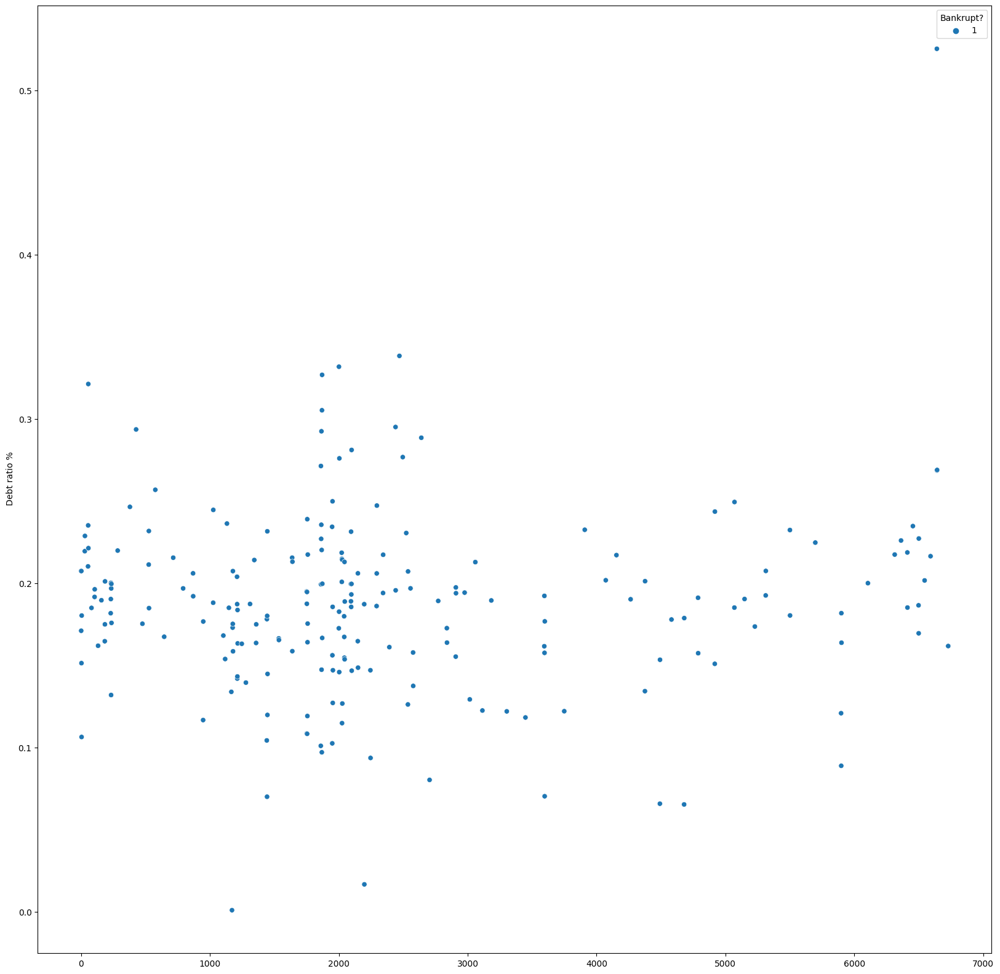

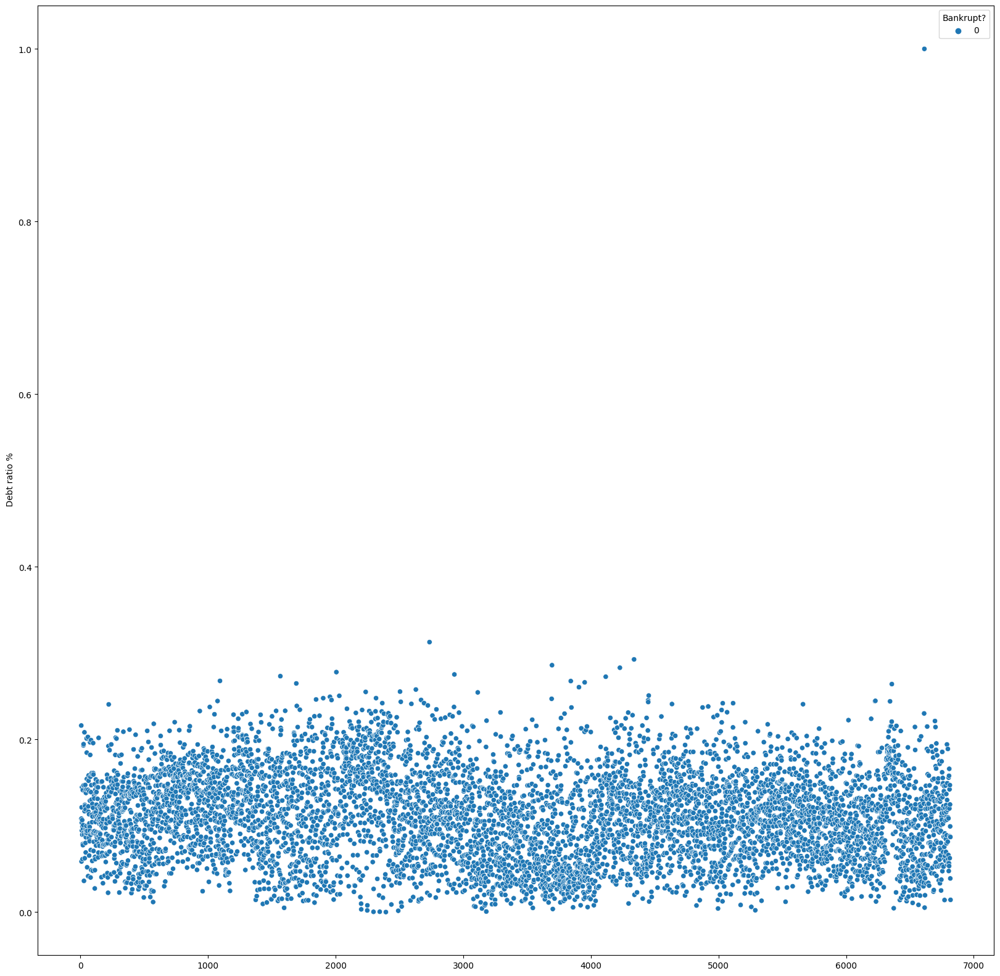

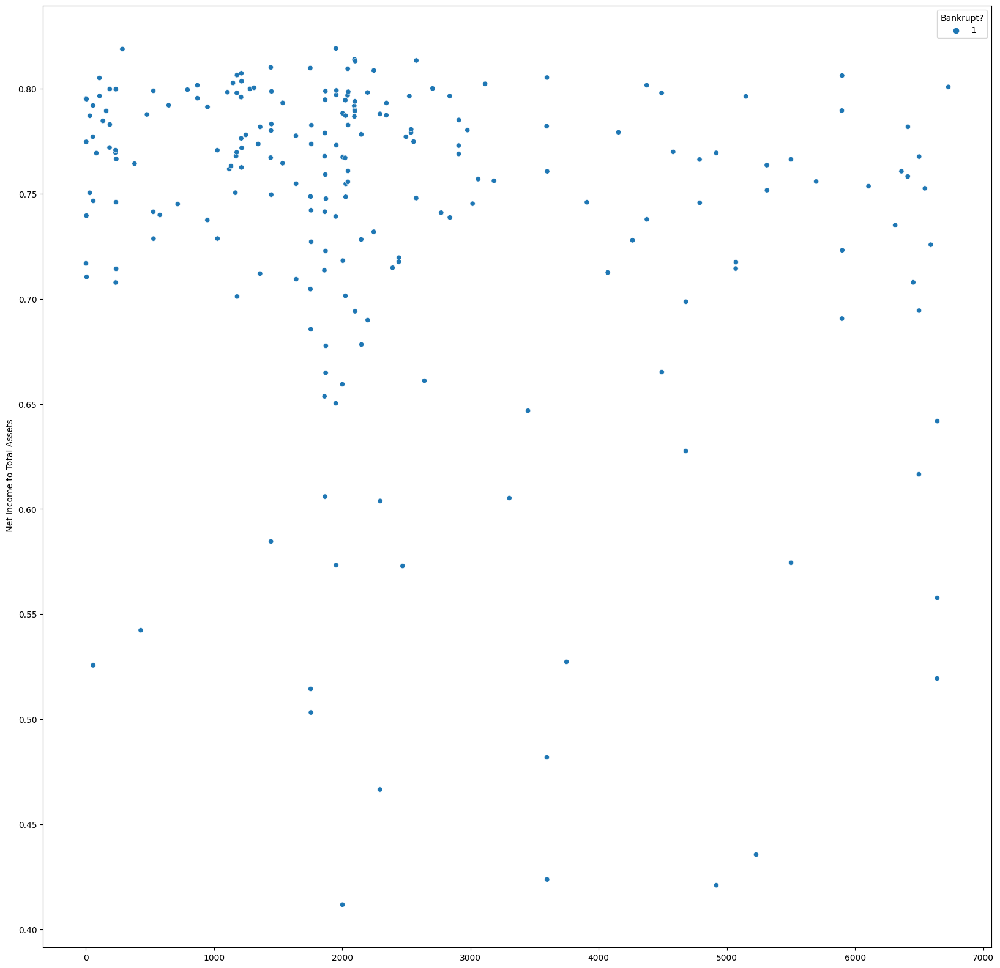

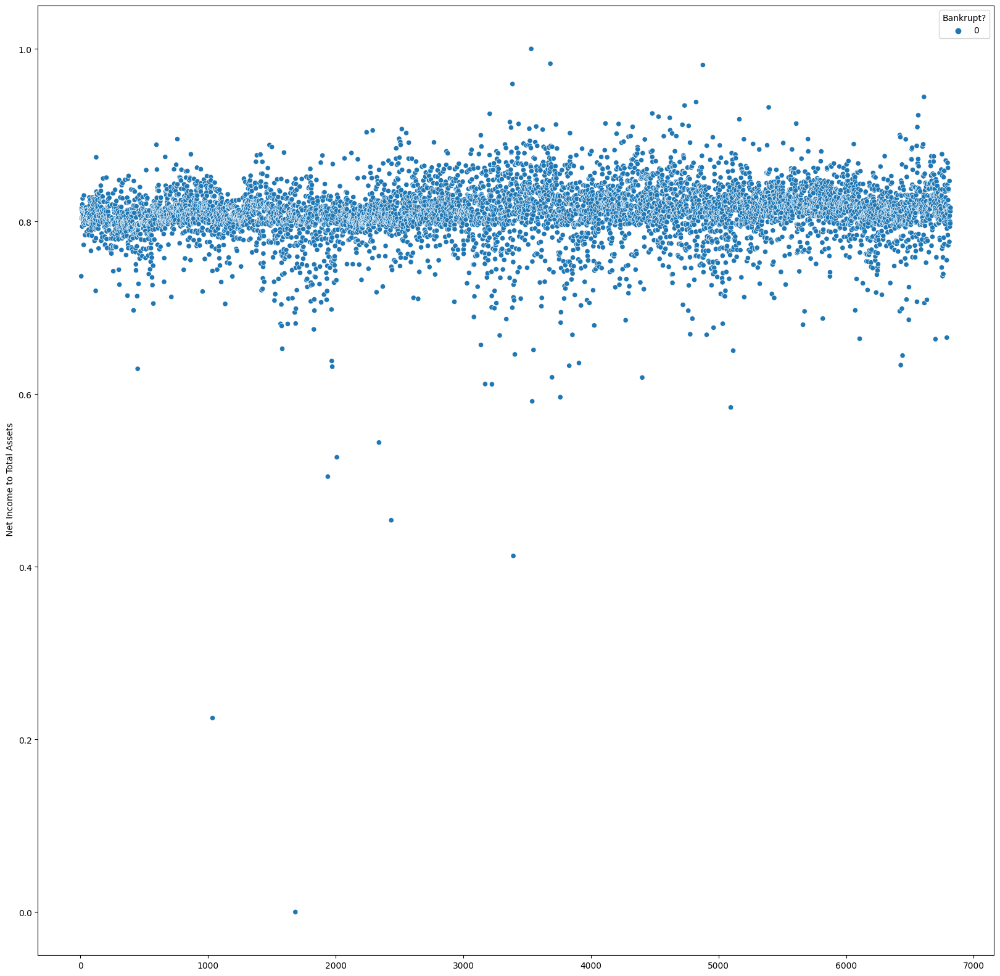

In [ ]:
df_bankrupt = df[df['Bankrupt?'] == 1]
df_not_bankrupt = df[df['Bankrupt?'] == 0]

fig = plt.figure(figsize = (20,20))
sns.scatterplot(x = df_bankrupt.index , y = ' ROA(C) before interest and % after tax', hue = 'Bankrupt?', data = df_bankrupt)
plt.show()
fig = plt.figure(figsize = (20,20))
sns.scatterplot(x = df_not_bankrupt.index , y = ' ROA(C) before interest and % after tax', hue = 'Bankrupt?', data = df_not_bankrupt)
plt.show()

fig = plt.figure(figsize = (20,20))
sns.scatterplot(x = df_bankrupt.index , y = ' Cash flow rate', hue='Bankrupt?', data=df_bankrupt)
plt.show()
fig = plt.figure(figsize = (20,20))
sns.scatterplot(x = df_not_bankrupt.index , y = ' Cash flow rate', hue='Bankrupt?', data=df_not_bankrupt)
plt.show()

fig = plt.figure(figsize = (20,20))
sns.scatterplot(x = df_bankrupt.index , y=' Debt ratio %', hue = 'Bankrupt?', data=df_bankrupt)
plt.show()
fig = plt.figure(figsize = (20,20))
sns.scatterplot(x = df_not_bankrupt.index , y=' Debt ratio %', hue = 'Bankrupt?', data=df_not_bankrupt)
plt.show()

fig = plt.figure(figsize = (20,20))
sns.scatterplot(x = df_bankrupt.index , y=' Net Income to Total Assets', hue = 'Bankrupt?', data=df_bankrupt)
plt.show()
fig = plt.figure(figsize = (20,20))
sns.scatterplot(x = df_not_bankrupt.index , y=' Net Income to Total Assets', hue = 'Bankrupt?', data=df_not_bankrupt)
plt.show()


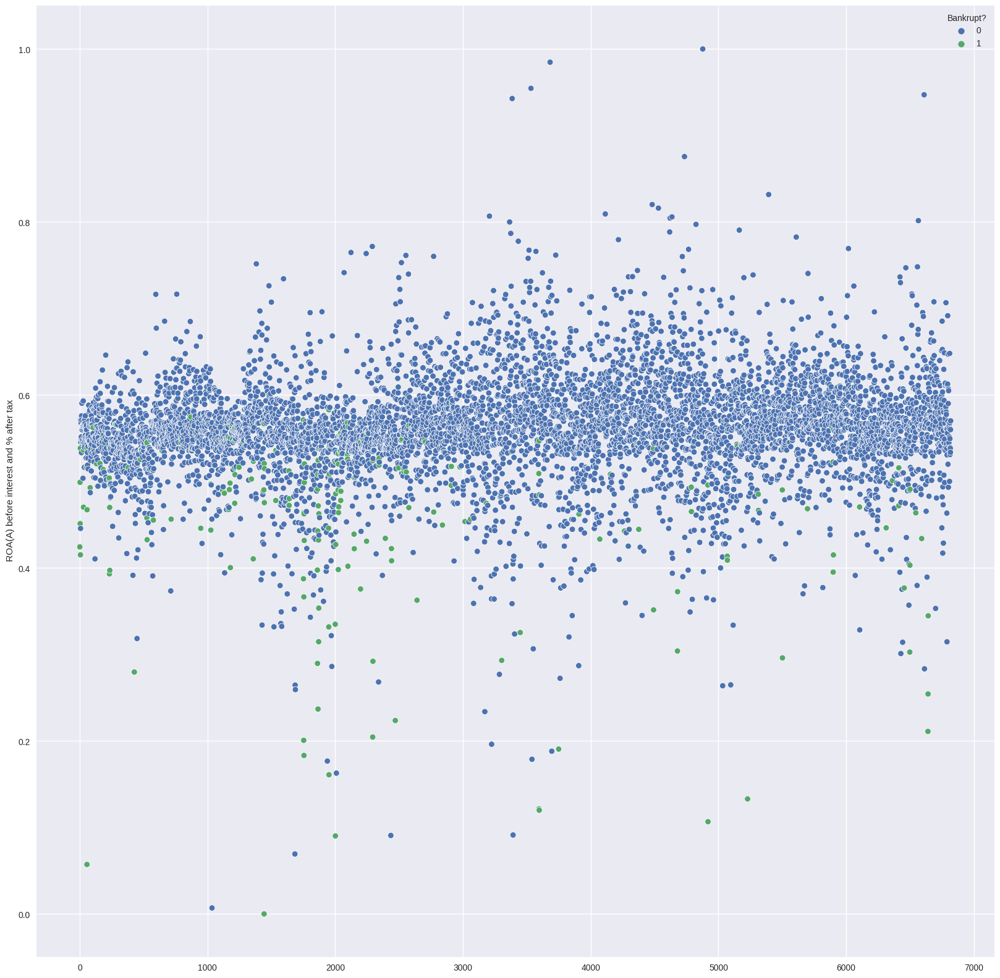

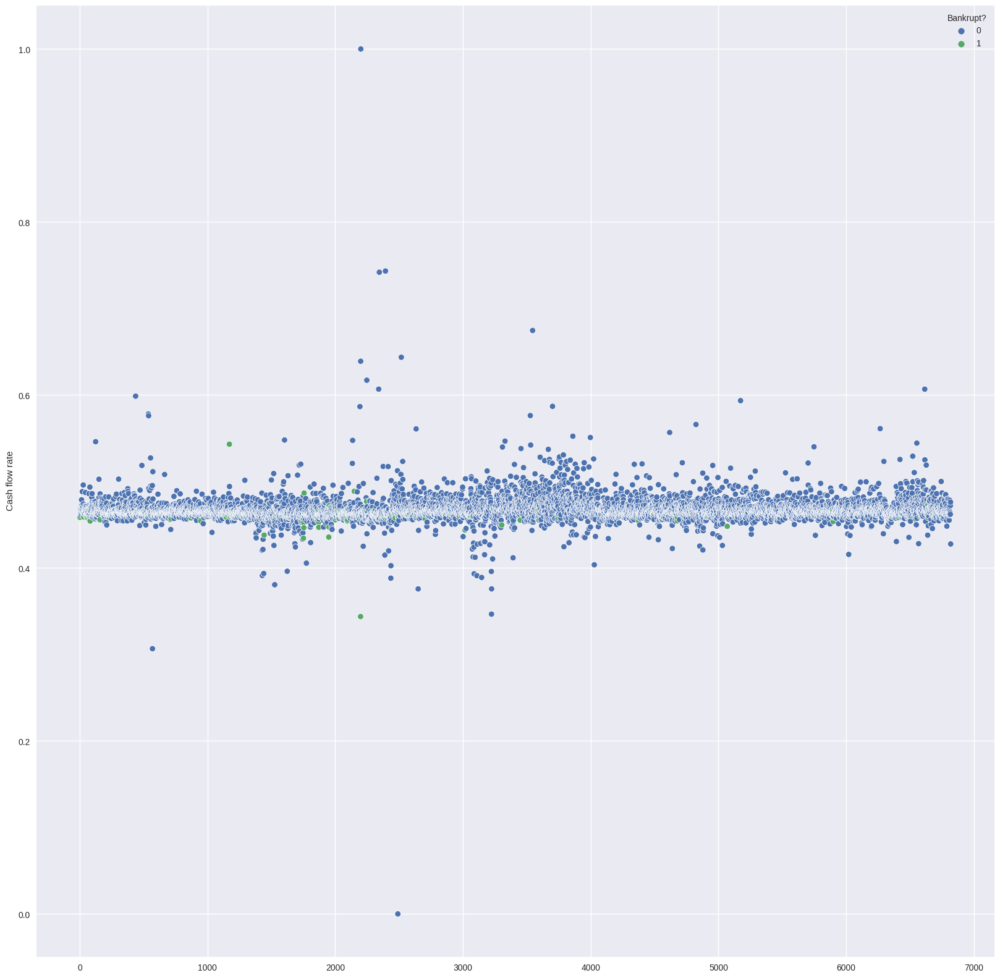

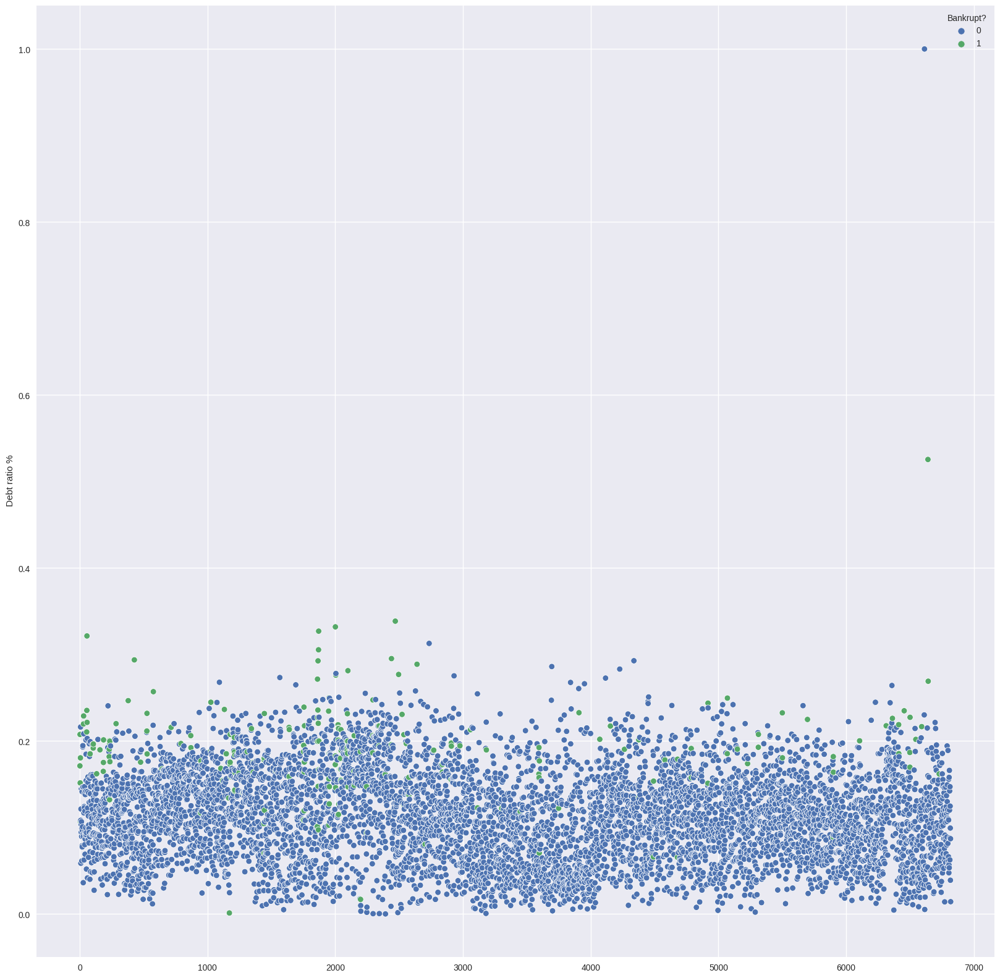

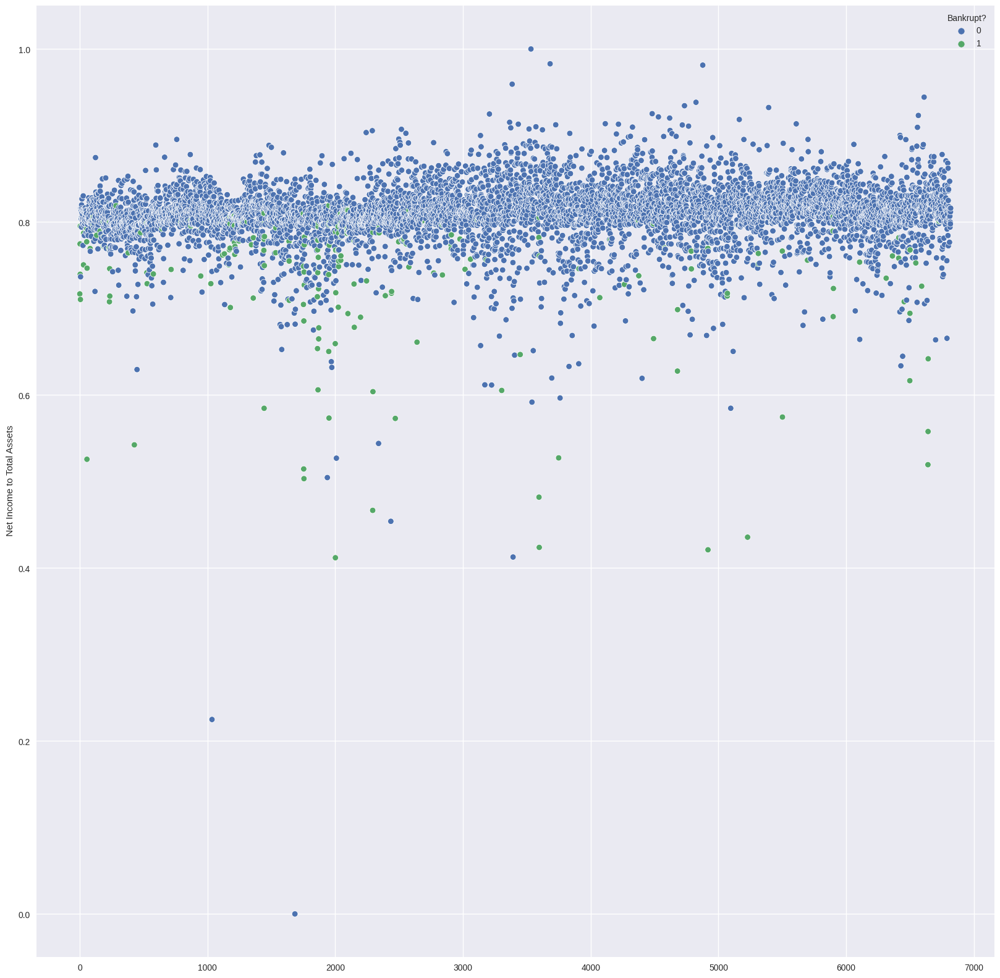

In [ ]:
fig = plt.figure(figsize = (20,20))
sns.scatterplot(x = df.index , y = ' ROA(C) before interest and % after tax', hue = 'Bankrupt?', data = df)
plt.show()
fig = plt.figure(figsize = (20,20))
sns.scatterplot(x = df.index , y = ' Cash flow rate', hue='Bankrupt?', data=df)
plt.show()
fig = plt.figure(figsize = (20,20))
sns.scatterplot(x = df.index , y=' Debt ratio %', hue = 'Bankrupt?', data=df)
plt.show()
fig = plt.figure(figsize = (20,20))
sns.scatterplot(x = df.index , y=' Net Income to Total Assets', hue = 'Bankrupt?', data=df)
plt.show()

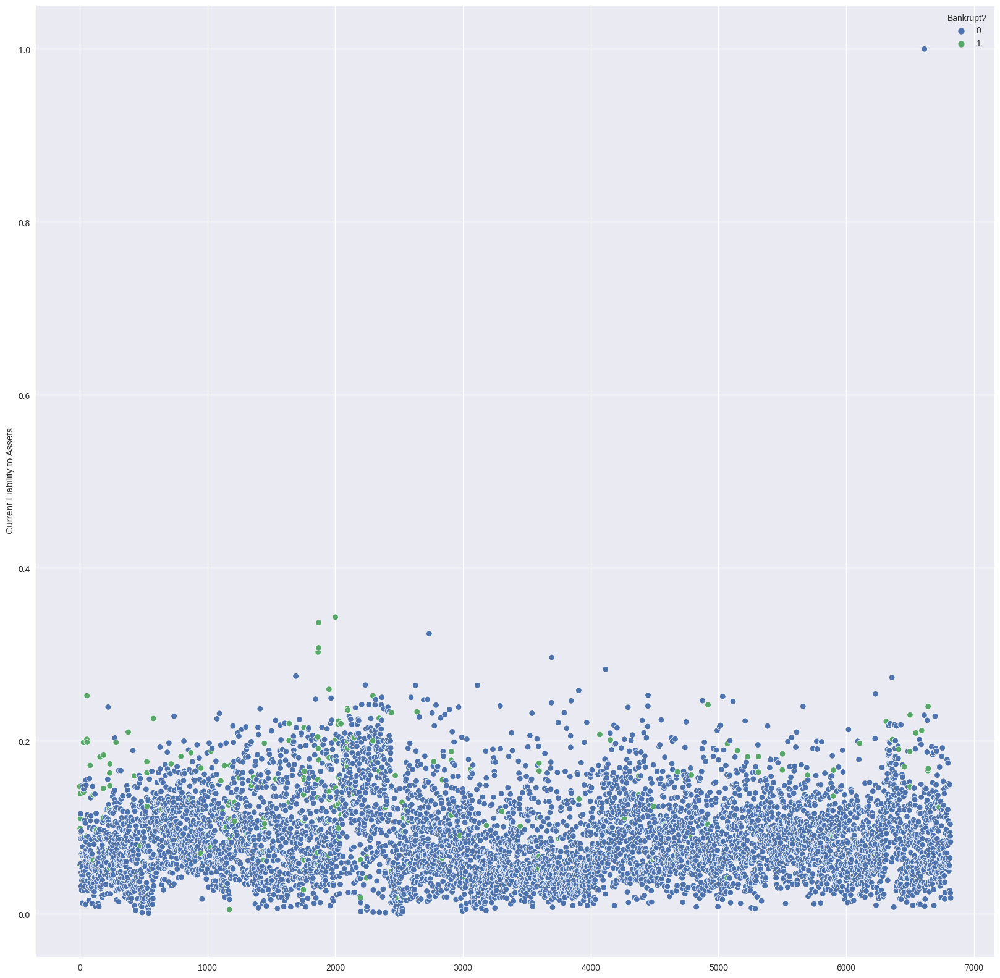

In [ ]:
fig = plt.figure(figsize = (20,20))
sns.scatterplot(x = df.index , y=' Current Liability to Assets', hue = 'Bankrupt?', data=df)
plt.show()

These scatter point plots show that there are multiple outliers but because the data is highly imbalanced, we cannot afford to drop data.
Moreover, we can see that lower values of "Net income to Total assets", "ROA (A) before interest and % after tax" and high values of "Debt Ratio %" have a tendency to lead to bankruptcy.

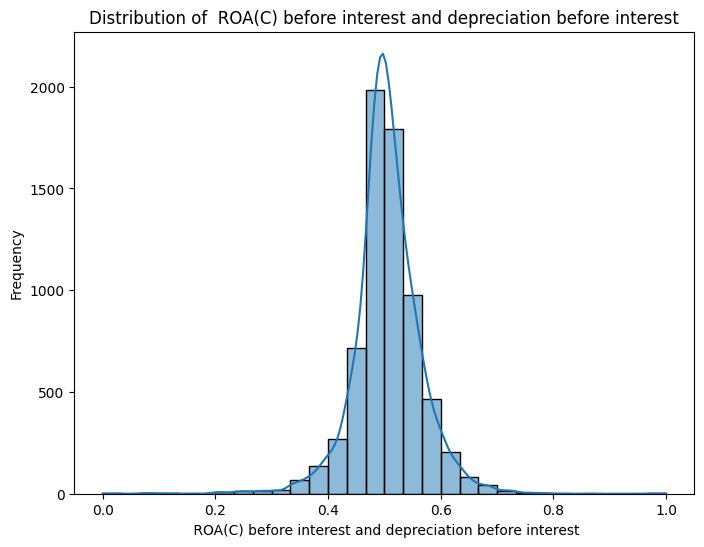

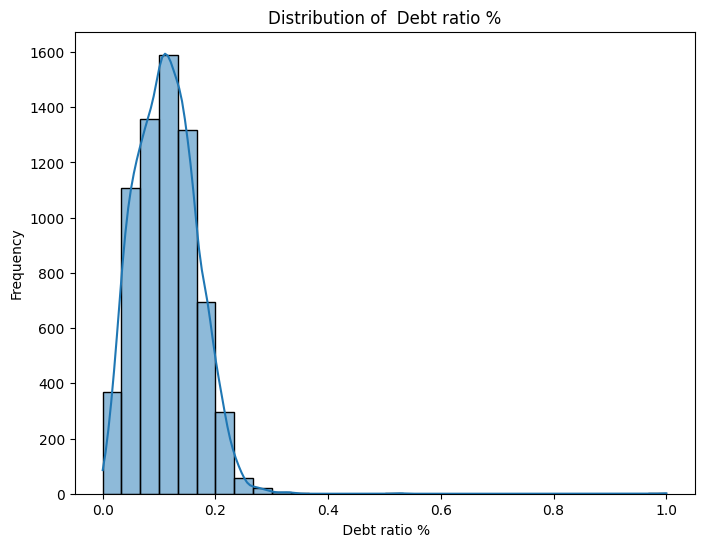

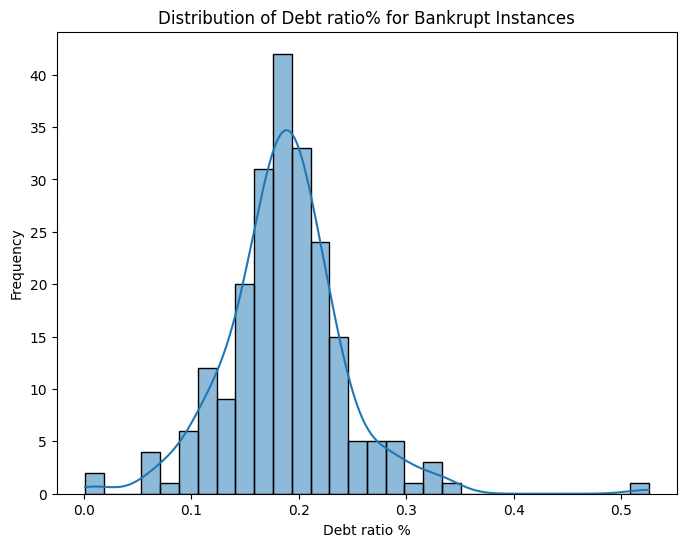

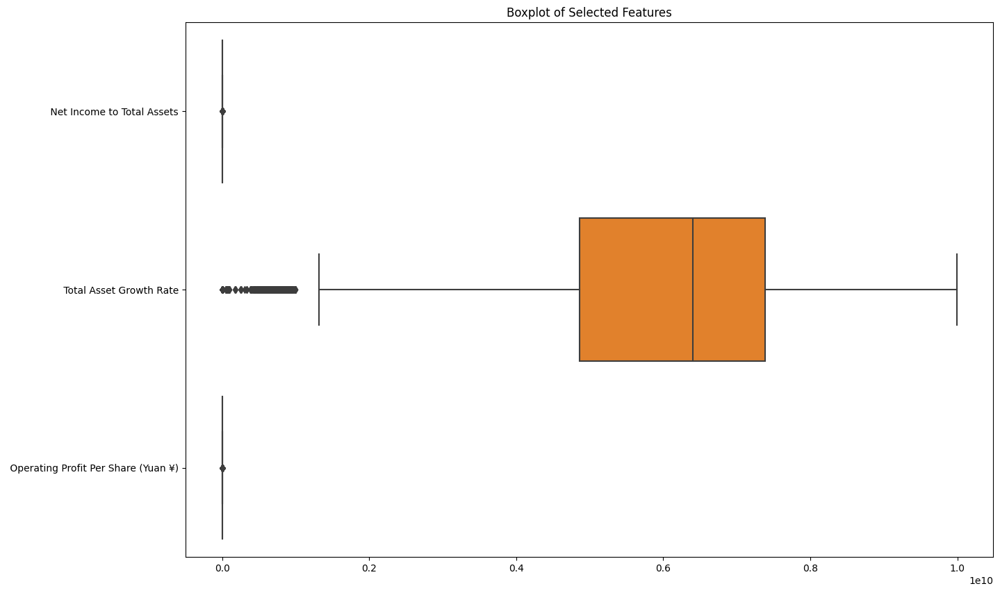

In [ ]:
features_to_visualize = [' ROA(C) before interest and depreciation before interest', ' Debt ratio %']
for feature in features_to_visualize:
    plt.figure(figsize=(8, 6))
    sns.histplot(df[feature], bins=30, kde=True)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()

plt.figure(figsize=(8, 6))
sns.histplot(df[df['Bankrupt?'] == 1][' Debt ratio %'], bins=30, kde=True)
plt.title('Distribution of Debt ratio% for Bankrupt Instances')
plt.xlabel('Debt ratio %')
plt.ylabel('Frequency')
plt.show()

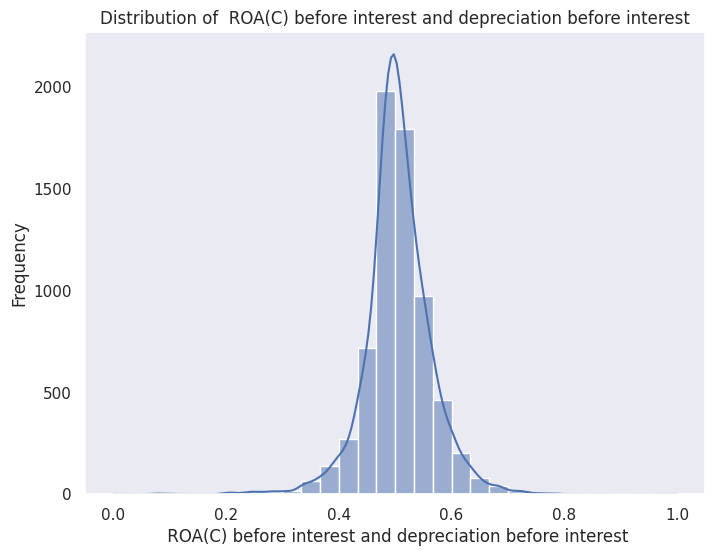

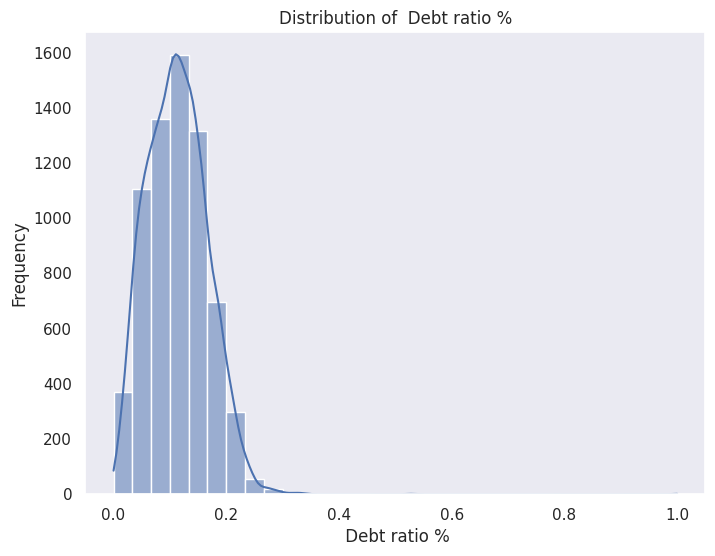

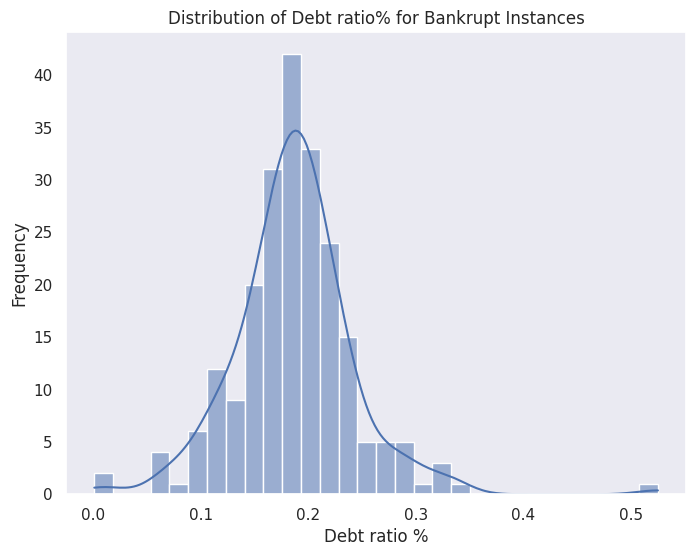

In [ ]:
features_to_visualize = [' ROA(C) before interest and depreciation before interest', ' Debt ratio %']
for feature in features_to_visualize:
    plt.figure(figsize=(8, 6))
    sns.histplot(df[feature], bins=30, kde=True)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()

plt.figure(figsize=(8, 6))
sns.histplot(df[df['Bankrupt?'] == 1][' Debt ratio %'], bins=30, kde=True)
plt.title('Distribution of Debt ratio% for Bankrupt Instances')
plt.xlabel('Debt ratio %')
plt.ylabel('Frequency')
plt.show()

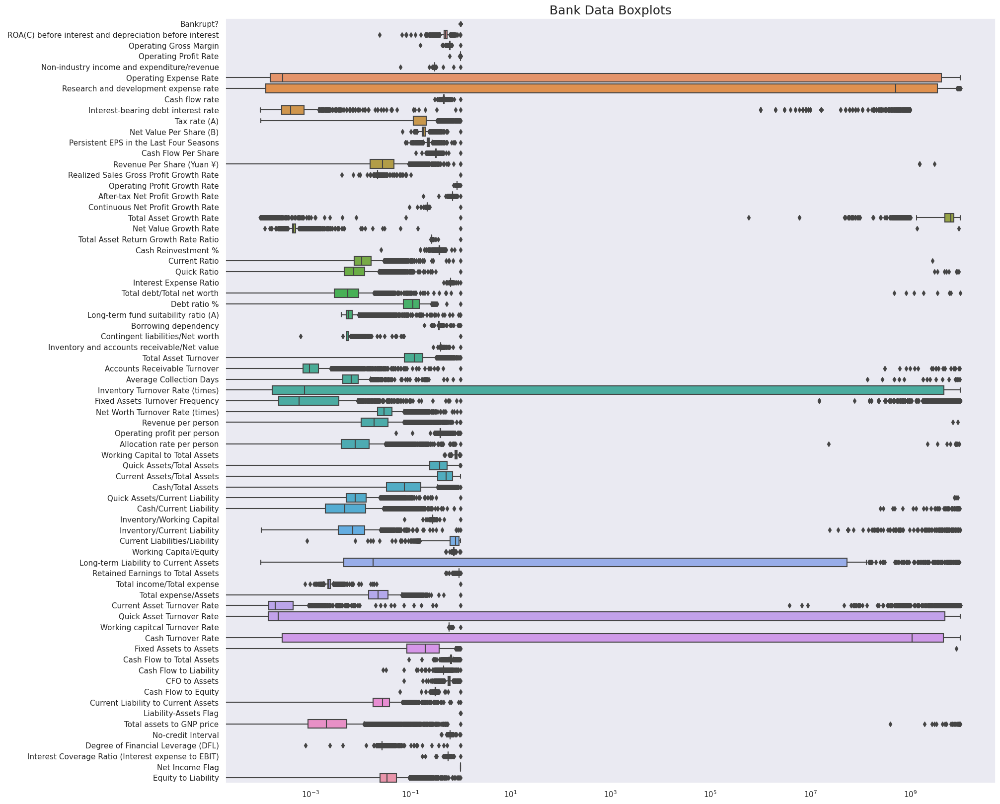

In [ ]:
plt.figure(figsize = (20,20))
ax =sns.boxplot(data = df, orient="h")
ax.set_title('Data Boxplots', fontsize = 18)
ax.set(xscale="log")
plt.show()

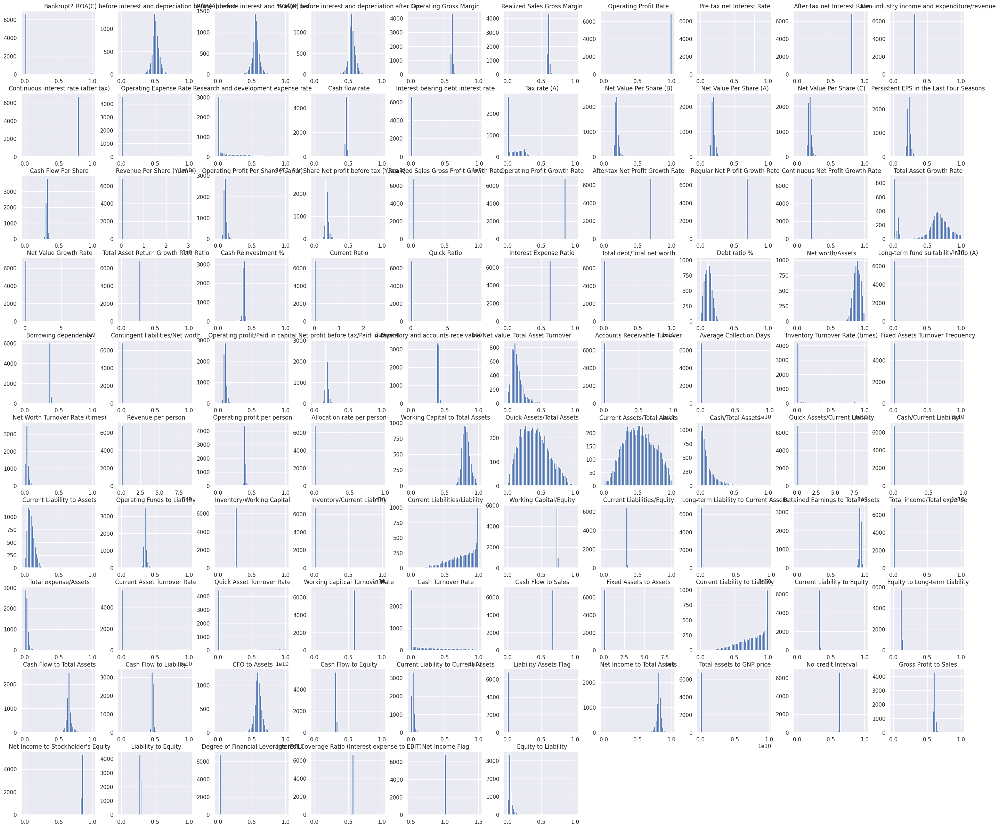

In [ ]:
df.hist(figsize = (35,30), bins = 50)
plt.show()

### Modeling

Now we're going to solve the class imbalance problem and test different models and try to find the best hyperparameters using GridSearch and cross-validation

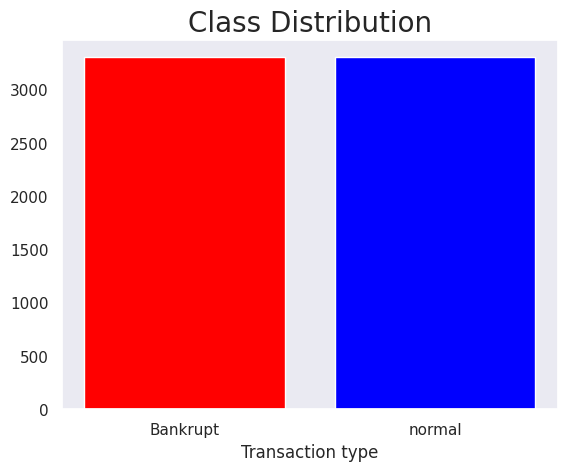

In [34]:
X = df.drop("Bankrupt?", axis=1)
X_rfe = df_rfe
Y = df['Bankrupt?']

scaler = StandardScaler()

#X_scaled = scaler.fit_transform(X)
#X_pca = principal_components
#X_pca_scaled = scaler.fit_transform(X_pca)
X_rfe_scaled = scaler.fit_transform(X_rfe)

smote_sampler = SMOTE()
ros = RandomOverSampler(random_state=0)

# Splitting into training and testing data without oversampling, we're choosing a test size of 50% to "undersample" the training data a bit but also to test on more bankrupt data samples

#x_train, x_test, y_train, y_test = train_test_split(X_scaled , Y, test_size=0.3, random_state=2) # Data without feature engineering / selection
x_train, x_test, y_train, y_test = train_test_split(X_rfe_scaled, Y, test_size=0.5, random_state=2) # RFE
#x_train, x_test, y_train, y_test = train_test_split(X_pca_scaled, Y, test_size=0.5, random_state=2) # PCA

# Oversampling only the training data
x_train, y_train = smote_sampler.fit_resample(x_train, y_train)
#x_train, y_train = ros.fit_resample(x_train, y_train)


bar_df = y_train.value_counts().reset_index()
plt.title('Class Distribution', fontsize=20)
plt.bar(bar_df['index'],
        bar_df['Bankrupt?'],
        color=['red', 'blue'],
        tick_label=['Bankrupt', 'normal']
       )
plt.xlabel('Transaction type')
plt.show()

In [ ]:
print('Training Data Shape   : ', x_train.shape)
print('Training Labels Shape : ', y_train.shape)
print('Testing Data Shape    : ', x_test.shape)
print('Testing Labels Shape  : ', y_test.shape)

Training Data Shape   :  (6606, 46)
Training Labels Shape :  (6606,)
Testing Data Shape    :  (3410, 46)
Testing Labels Shape  :  (3410,)
